# Heart Disease Analysis

#### We have just analysed the data to get estimate of which Classification algorithm should be used
#### We are applying ML-algorithms to get best prediction accuracy

### Libraries we have used :-

Pandas - pandas is an open source, BSD-licensed library providing high-performance, easy-to-use data structures and data analysis tools for the Python programming language.

Numpy - Numpy is a general-purpose array-processing package. It provides a high-performance multidimensional array object, and tools for working with these arrays. It is the fundamental package for scientific computing with Python.

Matplotlib - Matplotlib is a Python 2D plotting library which produces publication quality figures in a variety of hardcopy formats and interactive environments

Sklean - Scikit-learn is a free software machine learning library for the Python programming language

Scipy - SciPy is a free and open-source Python library used for scientific computing and technical computing

In [1]:
#importing libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (14,8)
import seaborn as sns

import scipy,sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score,confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier,export_graphviz
from sklearn.svm import SVC
from IPython.display import Image
from subprocess import call
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression

### Dataset Discription :-

We have taken Heart-Disease analysis dataset from provided database at -> https://archive.ics.uci.edu/ml/datasets/Heart+Disease

Dataset cointains 14 attributes and 303 tuples of heart disease data.


In [2]:
#loding the dataset
dataset = pd.read_csv("../input/heart-disease-uci/heart.csv")
print('Number of rows in the dataset: ',dataset.shape[0])
print('Number of columns in the dataset: ',dataset.shape[1])

Number of rows in the dataset:  303
Number of columns in the dataset:  14


### Glance at the Dataset

In [3]:
#printing first 5 rows of the dataset
dataset.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [4]:
#printing last 5 rows of the dataset
dataset.tail()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0
302,57,0,1,130,236,0,0,174,0,0.0,1,1,2,0


In [5]:
#discription of every coloum
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
age         303 non-null int64
sex         303 non-null int64
cp          303 non-null int64
trestbps    303 non-null int64
chol        303 non-null int64
fbs         303 non-null int64
restecg     303 non-null int64
thalach     303 non-null int64
exang       303 non-null int64
oldpeak     303 non-null float64
slope       303 non-null int64
ca          303 non-null int64
thal        303 non-null int64
target      303 non-null int64
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


From this data we can see that we need to scale some of the data like the `age` attribute and `thalach` attribute to get better accuracy with the alogorithms such as KNN.

In [6]:
#description of the dataset like mean, median, mode etc.
dataset.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


### 1. Sex

In [7]:
plt.rcParams["figure.figsize"] = (14,8)

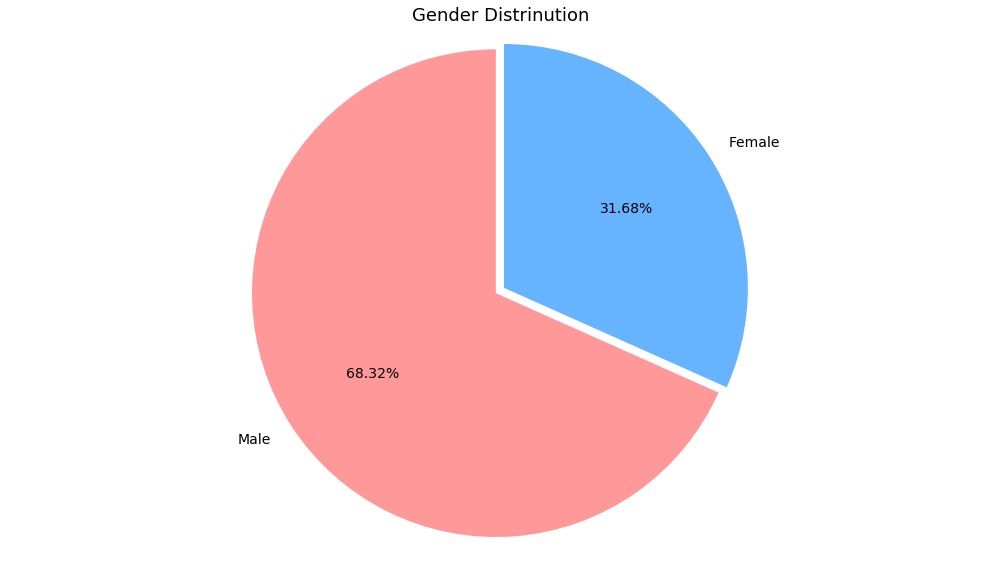

In [8]:
male = len(dataset[dataset.sex == 1])
colors = ['#ff9999','#66b3ff']
female = len(dataset[dataset.sex == 0])
plt.pie(x=[male, female], explode=(0.02, 0.02), labels=['Male', 'Female'],textprops={'fontsize': 14}, autopct='%1.2f%%', startangle=90, colors=colors)

plt.title("Gender Distrinution",fontsize=18)
plt.axis('equal')
plt.tight_layout()
plt.show()

rate of heart disease based on the sex

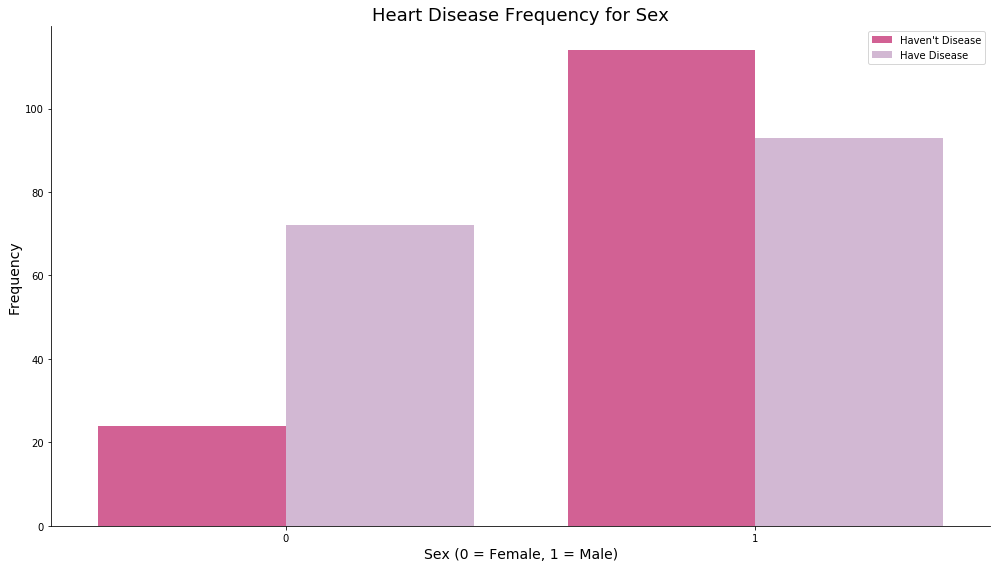

In [9]:
sns.countplot('sex',hue='target', data=dataset, palette='PuRd_r', alpha=0.8)
plt.title('Heart Disease Frequency for Sex', fontsize=18)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.grid(False)
plt.xlabel('Sex (0 = Female, 1 = Male)',fontsize=14)
    
plt.xticks(rotation=0)
plt.legend(["Haven't Disease", "Have Disease"])
plt.ylabel('Frequency', fontsize=14)

plt.tight_layout()
plt.show()

### 2. CP (chest pain type)

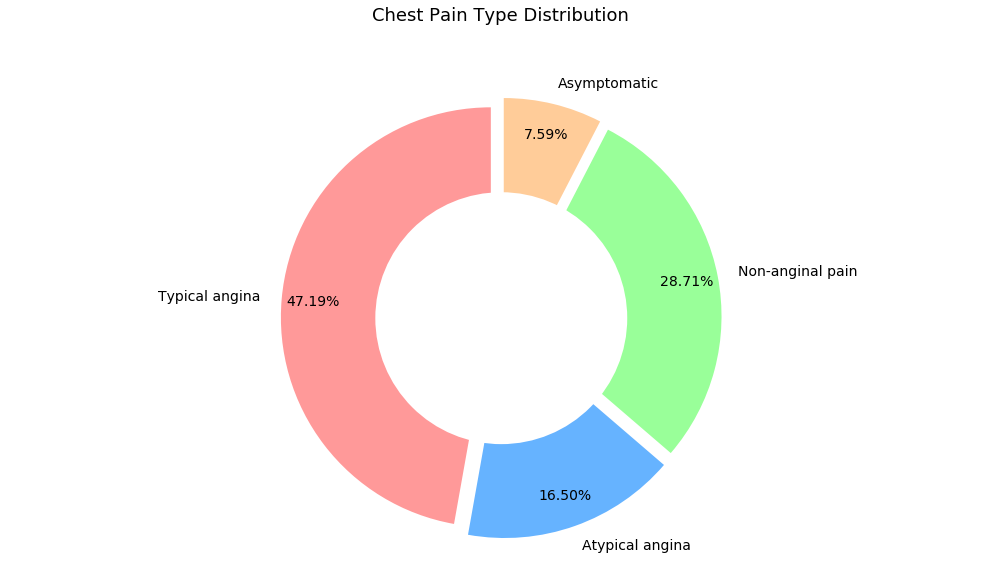

In [10]:
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
explode = (0.05,0.05,0.05,0.05)

x = [len(dataset[dataset['cp'] == 0]),len(dataset[dataset['cp'] == 1]), len(dataset[dataset['cp'] == 2]), len(dataset[dataset['cp'] == 3])]
plt.pie(x, data=dataset, labels=['Typical angina', 'Atypical angina', 'Non-anginal pain', 'Asymptomatic'],explode=explode,textprops={'fontsize': 14}, autopct='%1.2f%%',startangle=90,pctdistance=0.85, colors=colors)

plt.title("Chest Pain Type Distribution",fontsize=18,y=1.1)
centre_circle = plt.Circle((0,0),0.60,fc='white')
fig = plt.gcf()

fig.gca().add_artist(centre_circle)

plt.axis('equal')
plt.tight_layout()
plt.show()


Frequency distribution of chest pain type

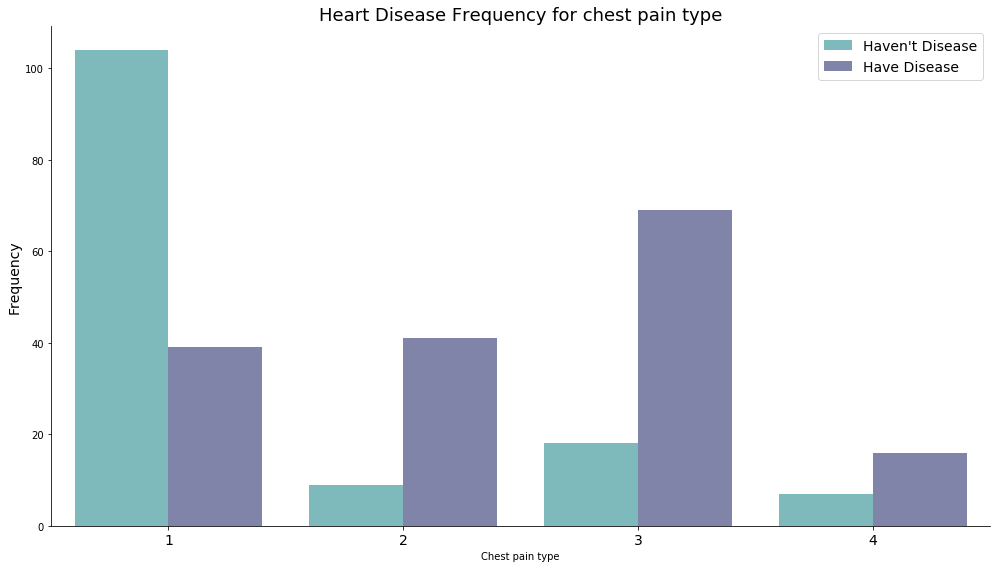

In [11]:
sns.countplot('cp',hue='target', data=dataset, palette='mako_r',alpha=0.7)
plt.title('Heart Disease Frequency for chest pain type', fontsize=18)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.xlabel('Chest pain type')
plt.grid(False)
plt.xticks(np.arange(4), [1, 2, 3, 4], rotation=0,fontsize=14)
plt.legend(["Haven't Disease", "Have Disease"],prop={'size':14})
plt.ylabel('Frequency',fontsize=14)

plt.tight_layout()
plt.show()

### 3. fbs (fasting blood sugar)
Distribution of the heart diseased people based on the fasting blood sugar

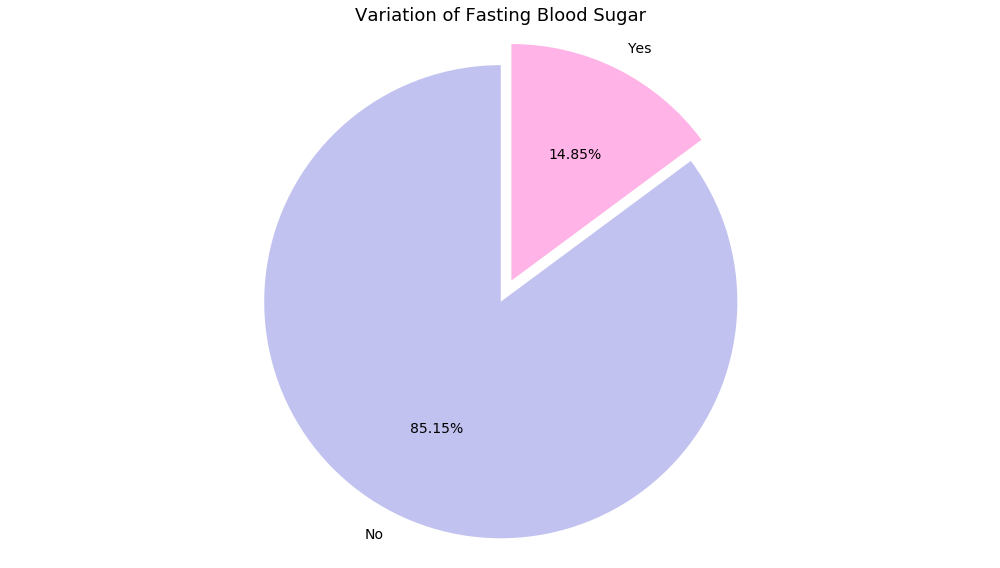

In [12]:
sizes = [len(dataset[dataset.fbs == 0]), len(dataset[dataset.fbs==1])]
colors = ['#c2c2f0','#ffb3e6']
labels = ['No', 'Yes']

plt.title("Variation of Fasting Blood Sugar", fontsize=18)
plt.pie(x=sizes, labels=labels, explode=(0.1, 0), autopct="%1.2f%%", startangle=90,colors=colors, textprops={'fontsize': 14})

plt.axis('equal')
plt.tight_layout()
plt.show()

For the people suffering from heart disease 15% of people have fasting blood sugar > 120 mg/dl

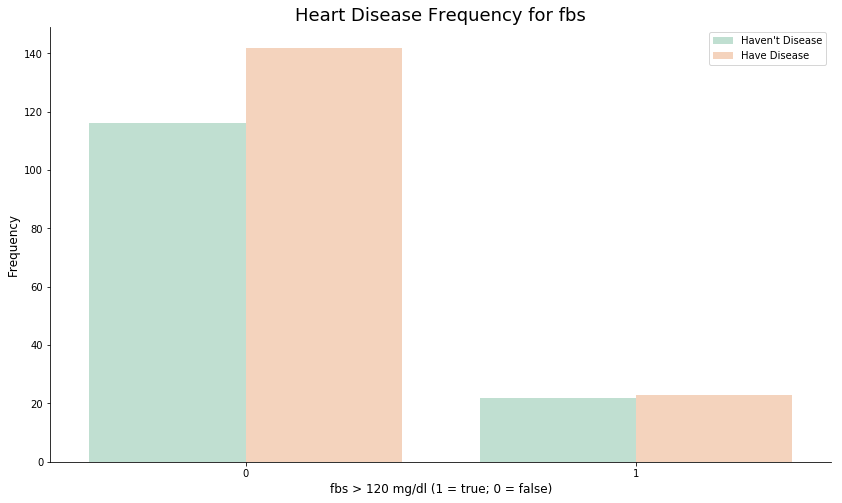

In [13]:
sns.countplot('fbs', hue='target', data=dataset, palette='Pastel2',alpha=0.9)
plt.title('Heart Disease Frequency for fbs',fontsize=18)

plt.grid(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.xticks(rotation=0)
plt.xlabel('fbs > 120 mg/dl (1 = true; 0 = false)',fontsize=12)
plt.legend(["Haven't Disease", "Have Disease"])
plt.ylabel('Frequency',fontsize=12)
plt.show()

### 3. restecg (resting electrocardiographic results)

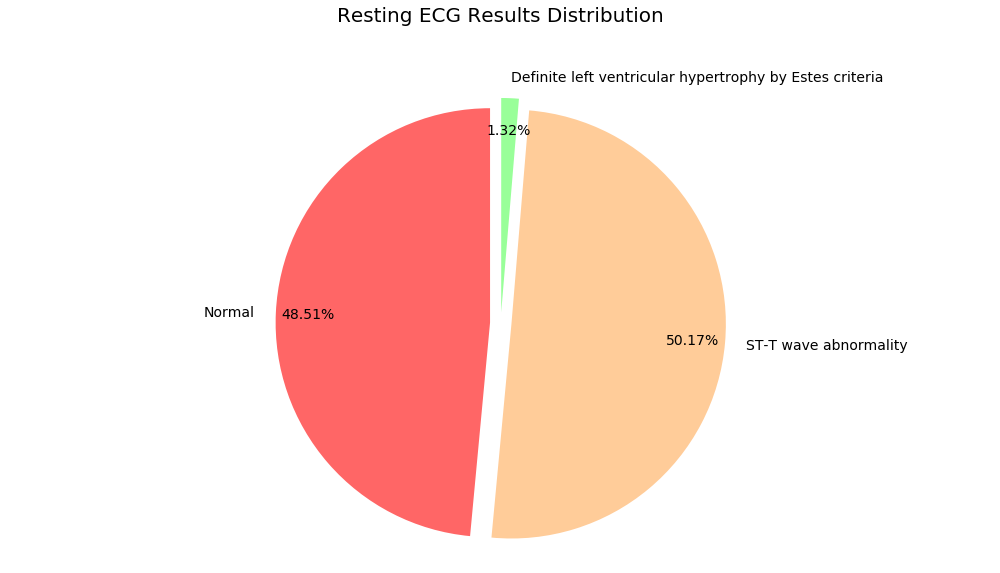

In [14]:
colors = ['#ff6666', '#ffcc99', '#99ff99']
sizes = [len(dataset[dataset.restecg == 0]), len(dataset[dataset.restecg==1]), len(dataset[dataset.restecg==2])]
labels = ['Normal', 'ST-T wave abnormality', 'Definite left ventricular hypertrophy by Estes criteria']

plt.pie(x=sizes, labels=labels, explode=(0.05, 0.05, 0.05) , autopct="%1.2f%%", startangle=90 , colors=colors, pctdistance=0.85, textprops={'fontsize': 14})
plt.title("Resting ECG Results Distribution",fontsize=20,y=1.1)

plt.axis('equal')
plt.tight_layout()
plt.show()

From the total samples we have 1.32% sample of definite left ventricular hypertrophy by Estes criteria. So, maybe our classifier doesn't train good on this much samples of this class in the data.

### Plotting bar chart for the people suffering and not suffering from disease based on the above class labels.

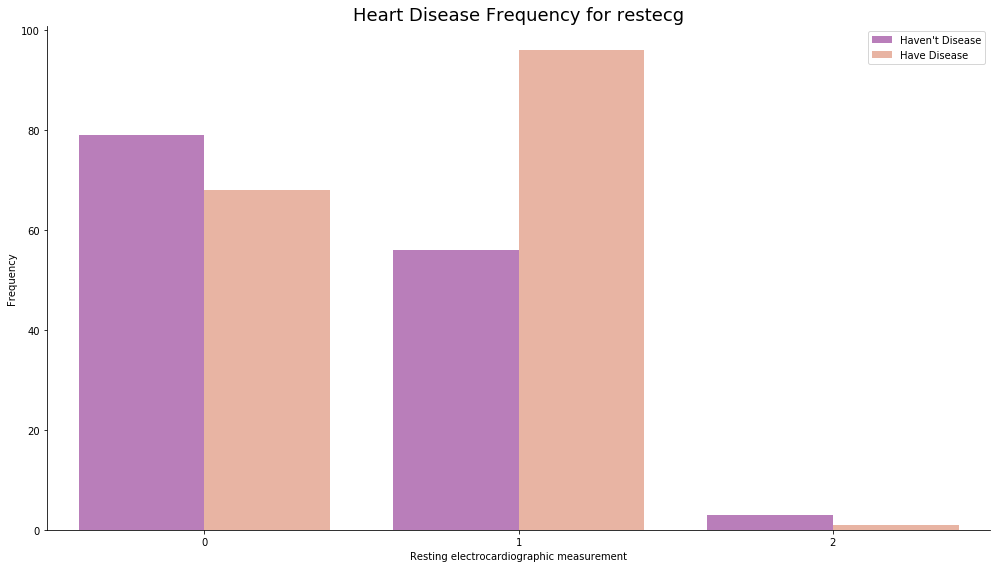

In [15]:
sns.countplot('restecg', hue='target', data=dataset, palette='plasma', alpha=0.6)
plt.title('Heart Disease Frequency for restecg', fontsize=18)
plt.xlabel('Resting electrocardiographic measurement')

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.grid(False)
plt.xticks(rotation=0)
plt.legend(["Haven't Disease", "Have Disease"])
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

### Histogram for `age` attribute.

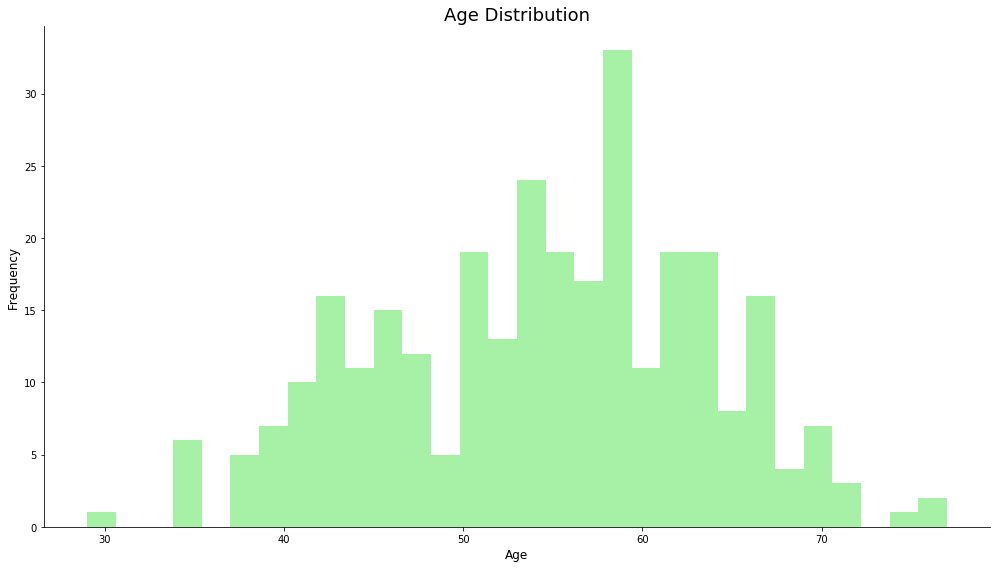

In [16]:
dataset.age.hist(bins=30,color="lightgreen",alpha=0.8)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.title('Age Distribution',fontsize=18)
plt.xlabel("Age",fontsize=12)
plt.ylabel("Frequency",fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()


Here we get a normal distribution. So it is helpful while using the Naive Bayes classifier on our data.

### Histograms for the people that suffer or don't suffer from heart disease based on their age.

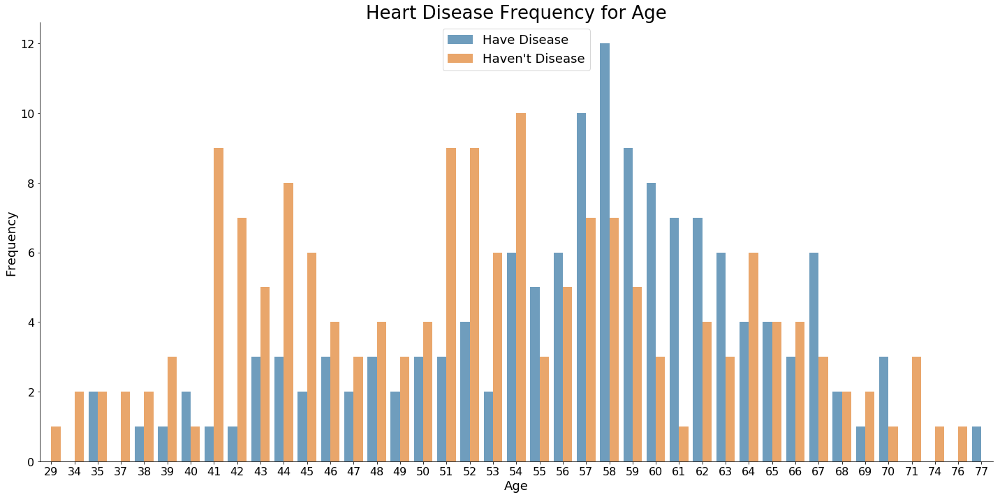

In [17]:
plt.figure(figsize=(20, 10))
sns.countplot('age', hue='target', data=dataset , alpha=0.7)

plt.grid(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.title('Heart Disease Frequency for Age',fontsize=26)
plt.legend(["Have Disease", "Haven't Disease"],prop={'size':18})
plt.ylabel('Frequency',fontsize=18)
plt.xlabel("Age",fontsize=18)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.show()

The above histogram shows that the people with higher age are more vulnerabe to heart disease.

### Distribution of heart diseased people based on their cholestrol level

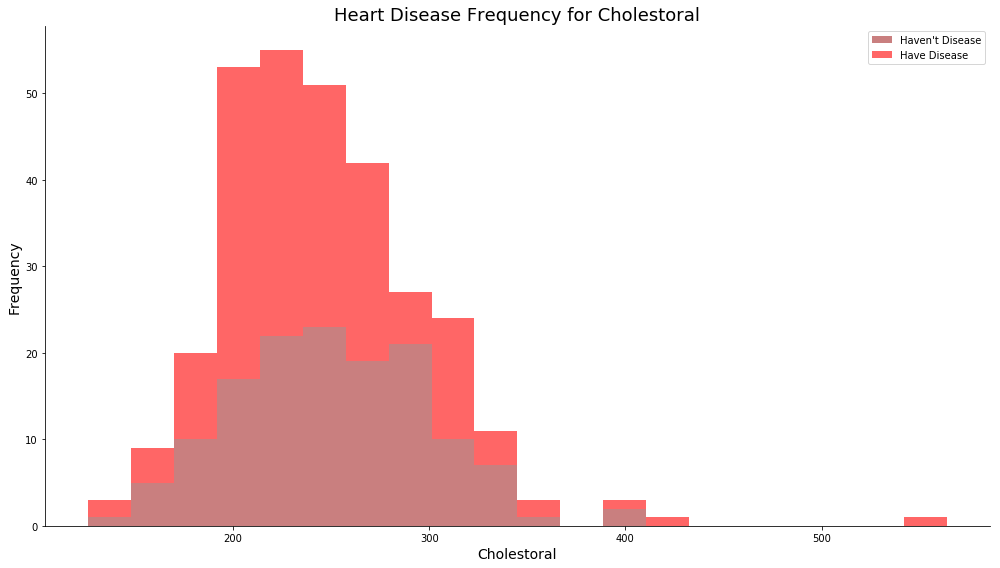

In [18]:
plt.hist([dataset.chol[dataset.target==0], dataset.chol[dataset.target==1]], bins=20,color=['brown', 'red'],alpha=0.6, stacked=True)
plt.legend(["Haven't Disease", "Have Disease"])

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid(False)
plt.title('Heart Disease Frequency for Cholestoral',fontsize=18)
plt.ylabel('Frequency',fontsize=14)
plt.xlabel('Cholestoral',fontsize=14)

plt.tight_layout()
plt.show()


Heart disease frequency histogram is used to detect if there is any outliars in data and visualise distribution of data.
From this histogram, we concluded that it is following Normal Distribution and there is a small outliar in data which we dont need to bother about 

### Distribution for heart diseased people based on the maximimum heart rate or the pulse rate achieved

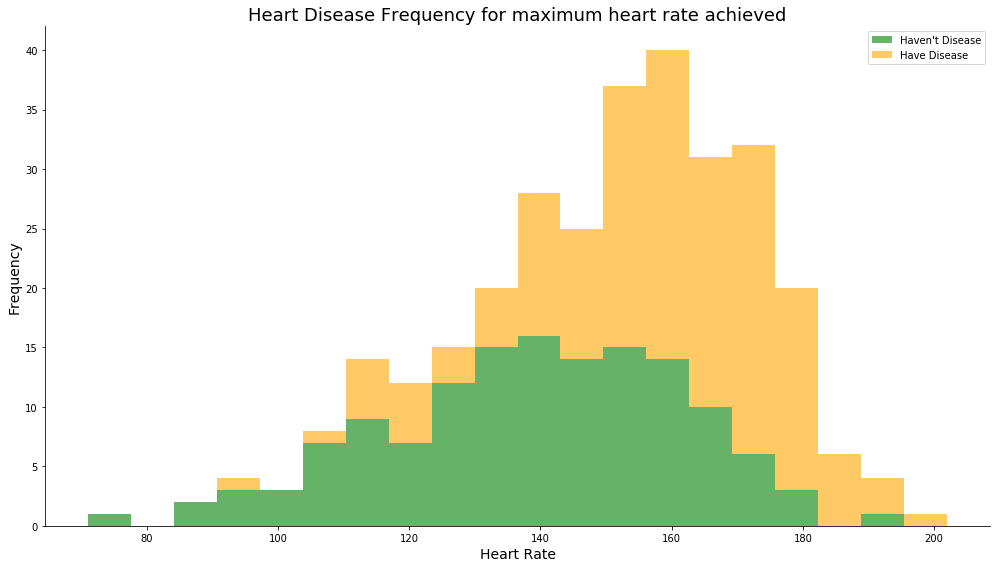

In [19]:
plt.hist([dataset.thalach[dataset.target==0], dataset.thalach[dataset.target==1]], bins=20,color=['green', 'orange'], stacked=True,alpha=0.6)
plt.legend(["Haven't Disease", "Have Disease"])

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid(False)
plt.title('Heart Disease Frequency for maximum heart rate achieved',fontsize=18)

plt.xlabel("Heart Rate",fontsize=14)
plt.ylabel('Frequency',fontsize=14)

plt.tight_layout()
plt.show()

### Dividing data into labels and training data

In [20]:
y = dataset["target"]
x = dataset.drop(["target"],axis=1)

### Ploting the heat map for the data based on the correlation between attributes

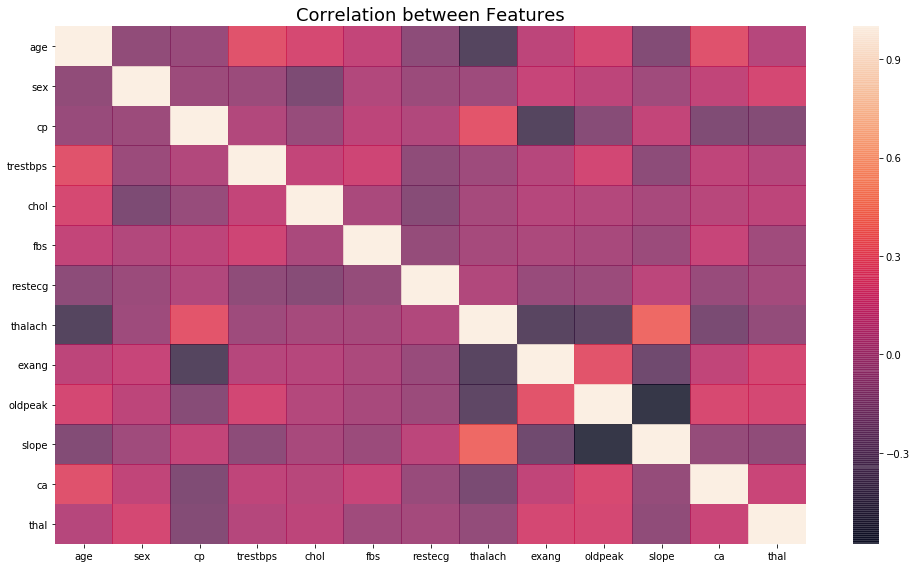

In [21]:
sns.heatmap(x.corr(),alpha=0.8)

plt.title("Correlation between Features",fontsize=18)
plt.tight_layout()
plt.show()

* We have created correlation matrix between attributes to get inference about correlation between attributes.
* By observing the correlation matrix , we can say that there is very less relation between attributes, except for a few.
* From this information, we can take inference that it would be profitable to use Naive Bayes classification algorithm.


### Glance at the data

In [22]:
y.head()

0    1
1    1
2    1
3    1
4    1
Name: target, dtype: int64

unique values in y define if it is a binary classification or a multi class classification task

In [23]:
np.unique(y)

array([0, 1])

Here we can see that it is a binary class classification task


So converting x and y dataframes to numpy array

In [24]:
x = x.values
y = y.values

* Diving the dataset to train and test dataset for analysis

* We have used stratification sampling of the dataset to get better results in classification

* We have splitted the dataset to 75:25 ratio for training and testing data

In [25]:
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.25, random_state=42)

* We have scaled the data to get the high accuray in classifiers to prevent the effect of non-scaled attributes

* We have used `StandardScaler()` function from sklearn. 

* The idea behind StandardScaler is that it will transform the data such that its distribution will have a mean value 0 and standard deviation of 1.

* In case of multivariate data, this is done feature-wise i.e. independently for each column of the data

In [26]:
scaler = StandardScaler()

X_train = scaler.fit_transform(x_train)
X_train = pd.DataFrame(x_train)

X_test = scaler.transform(x_test)
X_test = pd.DataFrame(x_test)

* We have made some of the helper function( `classificationrep` and `confusionmatrix` )  for the classifcation report and classification matrix generation as well as we have also calculated the accuracy for each classifier

In [27]:
#helper function for the confusion matrix and classification report which gives us 
#presion, recall, f1-score, accuracy, support 
def classificationrep(preds):
    print(classification_report(y_test,preds))
    
def confusionmatrix(preds):
    cnf_matrix = confusion_matrix(y_test,preds)
    class_names = [0,1]
    fig,ax = plt.subplots()
    tick_marks = np.arange(len(class_names))
    
    plt.xticks(tick_marks,class_names)
    plt.yticks(tick_marks,class_names)

    sns.heatmap(pd.DataFrame(cnf_matrix), annot = True, cmap = 'YlGnBu',fmt = 'g')
    ax.xaxis.set_label_position('top')

    plt.tight_layout()
    plt.title('Confusion matrix for Model', y = 1.1,fontsize=18)
    plt.ylabel('Actual label',fontsize=12)
    plt.xlabel('Predicted label',fontsize=12)
    plt.show()

**Decision tree** : A decision tree is a decision support tool that uses a tree-like model of decisions and their possible consequences, including chance event outcomes, resource costs, and utility. It is one way to display an algorithm that only contains conditional control statements.

### Applying decision tree classifier to the data.
1. Firstly we have used the "gini" index criterion and max_depth is not limited in the first model
2. In the second model we have used the gini index with the max_depth limited this gives us the bump in the accuracy as the model does not overfit to the test dataset.
3. In the third model we have used the entropy criterion with the max_depth limited as it gave us the high accuracy in the second model and we can see we get even higher accuracy with this model.
We have plotted the decision tree using the graphviz library of python and showed how decision tree is formed and at which point it has splits

In [28]:
#Decision tree classifier
#parameters we have used 
clf = DecisionTreeClassifier(criterion="gini",max_depth=None)
clf.fit(x_train,y_train)
d1 = clf.score(x_test, y_test)
print(d1)

0.7631578947368421


### Creating decision tree with :
* Gini criteria
* Without depth limiting

In [29]:
clf

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [30]:
export_graphviz(clf, out_file='tree.dot',rounded = True, proportion = True, label='root', filled = True)
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
Image(filename = 'tree.png')

### Creating decision tree with :
* Gini criteria
* Depth limiting the tree to 4

In [31]:
clf = DecisionTreeClassifier(criterion="gini",max_depth=4)
clf.fit(x_train,y_train)
d2 = clf.score(x_test, y_test)
print(d2)

0.8157894736842105


In [32]:
clf

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [33]:
export_graphviz(clf, out_file='tree.dot',rounded = True, proportion = True, label='root', filled = True)
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
Image(filename = 'tree.png')

### Creating a decision tree with
* Entropy criteria
* Depth limited to 4

In [34]:
clf = DecisionTreeClassifier(criterion="entropy",max_depth=4)
clf.fit(x_train,y_train)
pred = clf.predict(x_test)
d3 = clf.score(x_test, y_test)
print(d3)

0.8421052631578947


In [35]:
clf

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

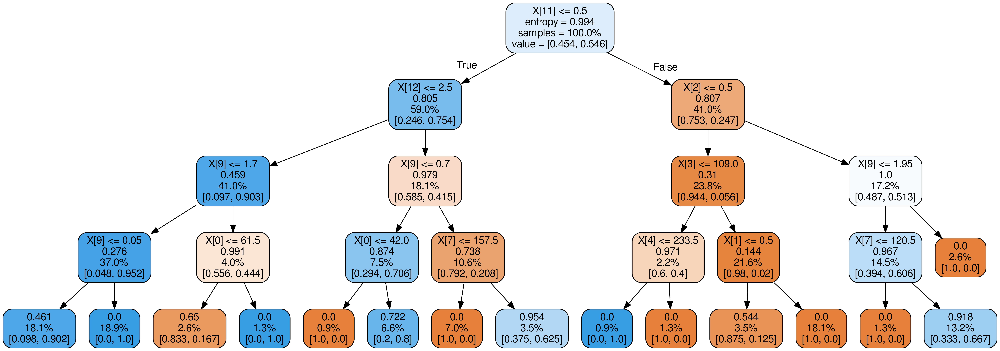

In [36]:
export_graphviz(clf, out_file='tree.dot',rounded = True, proportion = True, label='root', filled = True)
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
Image(filename = 'tree.png')

### Confusion matrix for Entropy based decision tree

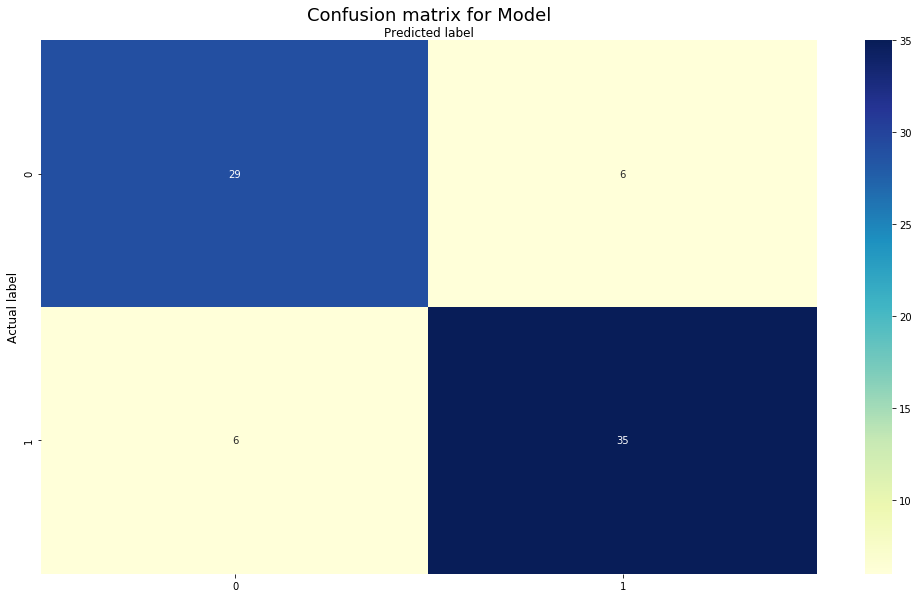

              precision    recall  f1-score   support

           0       0.83      0.83      0.83        35
           1       0.85      0.85      0.85        41

    accuracy                           0.84        76
   macro avg       0.84      0.84      0.84        76
weighted avg       0.84      0.84      0.84        76



In [37]:
confusionmatrix(pred)
classificationrep(pred)

### SVM

@aksaht add your contribution here....

Some lines about the svm how it classifies the data what are its kernal and how we can utilize them to classify correctly

All other parameters used for svm

Other kernals bit of a overkill
Other kernals led to the overfitting of the data we have showcased the use of rbf kernal on the data and it gives very less accuracy as compared to the other keranl

In [38]:
svc = SVC(kernel='linear')
svc.fit(x_train, y_train)
pred = clf.predict(x_test)
s1 = svc.score(x_test, y_test)
print(s1)

0.868421052631579


In [39]:
svc

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='linear', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

### Confusion matrix for the above SVC classifier

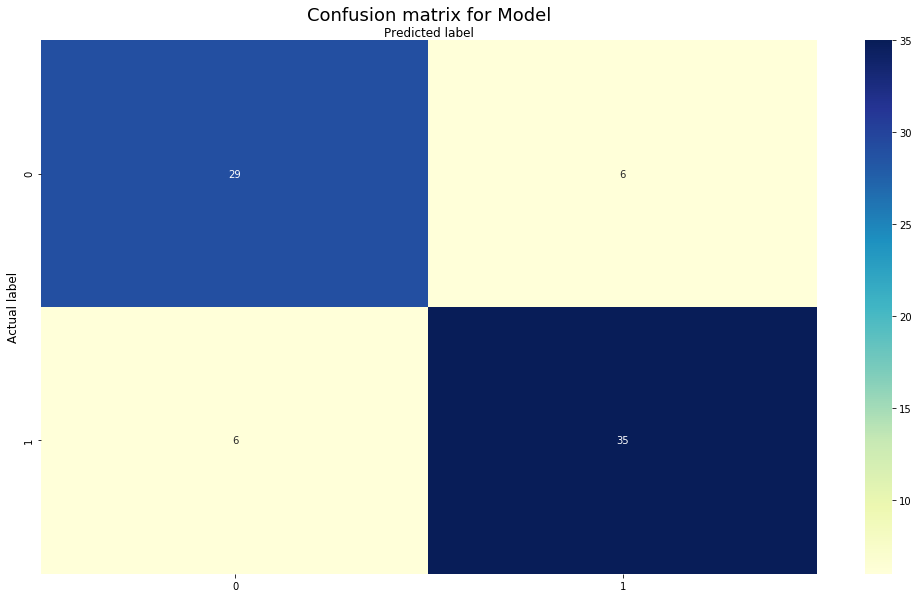

              precision    recall  f1-score   support

           0       0.83      0.83      0.83        35
           1       0.85      0.85      0.85        41

    accuracy                           0.84        76
   macro avg       0.84      0.84      0.84        76
weighted avg       0.84      0.84      0.84        76



In [40]:
confusionmatrix(pred)
classificationrep(pred)

In [41]:
svc = SVC(gamma='auto')
svc.fit(x_train, y_train)
pred = clf.predict(x_test)
s1 = svc.score(x_test, y_test)
print(s1)

0.5526315789473685


In [42]:
svc

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

### Confusion matrix for the above SVC classifier

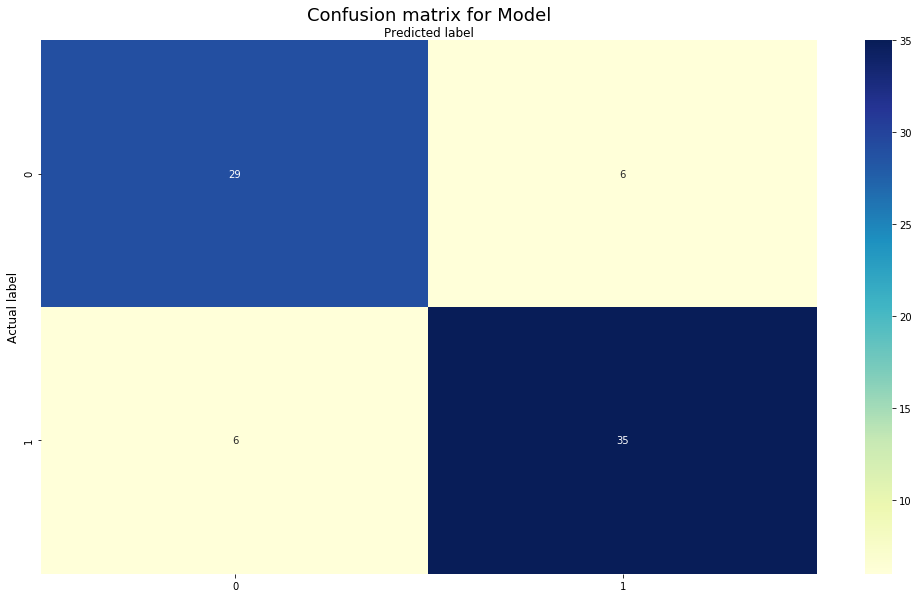

              precision    recall  f1-score   support

           0       0.83      0.83      0.83        35
           1       0.85      0.85      0.85        41

    accuracy                           0.84        76
   macro avg       0.84      0.84      0.84        76
weighted avg       0.84      0.84      0.84        76



In [43]:
confusionmatrix(pred)
classificationrep(pred)

#### How AdaBoostClassifier works :-

1. The base learner takes all the distributions and assign equal weight or attention to each observation.
2. If there is any prediction error caused by first base learning algorithm, then we pay higher attention to observations having prediction error. Then, we apply the next base learning algorithm.
3. Iterate Step 2 till the limit of base learning algorithm is reached or higher accuracy is achieved.

Finally, it combines the outputs from weak learner and creates  a strong learner which eventually improves the prediction power of the model. Boosting pays higher focus on examples which are mis-classiﬁed or have higher errors by preceding weak rules.

In [44]:
clf = AdaBoostClassifier(n_estimators=3)
clf.fit(x_train,y_train)
pred = clf.predict(x_test)
c1 = clf.score(x_test, y_test)
print(c1)

0.868421052631579


### 

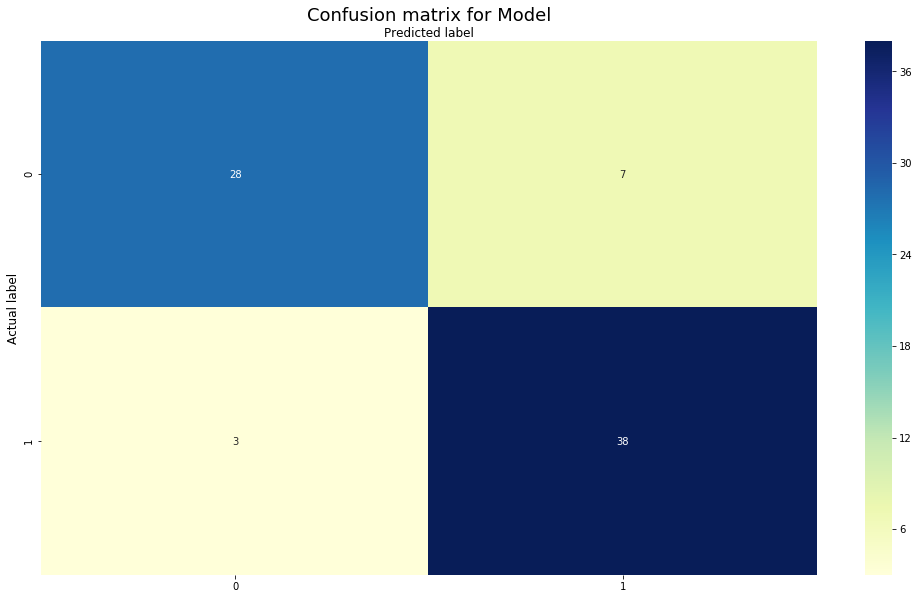

              precision    recall  f1-score   support

           0       0.90      0.80      0.85        35
           1       0.84      0.93      0.88        41

    accuracy                           0.87        76
   macro avg       0.87      0.86      0.87        76
weighted avg       0.87      0.87      0.87        76



In [45]:
confusionmatrix(pred)
classificationrep(pred)

### Plotting the accuracy (score) for different count of estimators for adaBoost classifier

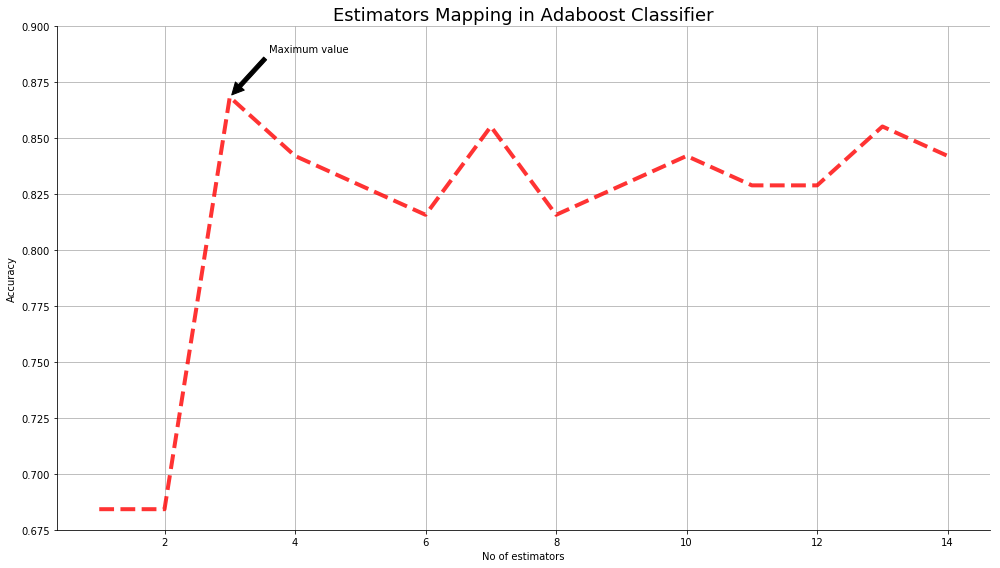

In [46]:
a = []
b = []
for i in range(1,15):
    clf = AdaBoostClassifier(n_estimators=i)
    clf.fit(x_train,y_train)
    pred = clf.predict(x_test)
    c1 = clf.score(x_test, y_test)
    a.append(c1)
    b.append(i)
    
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

ymax = max(a)

plt.title("Estimators Mapping in Adaboost Classifier",fontsize=18)
plt.grid(True)
plt.plot(b,a,linewidth=4,color="red",alpha=0.8,linestyle='dashed')
plt.xlabel("No of estimators")
plt.ylabel("Accuracy")
plt.ylim((0.675,0.90))

xpos = a.index(ymax)
xmax = b[xpos]

plt.annotate('Maximum value',xy=(xmax, ymax),arrowprops=dict(facecolor='black', shrink=0.05),xytext=(xmax+0.6, ymax+0.02))

plt.tight_layout()
plt.show()

From the above graph we infer that, we have maximum accuracy for 4 estimators with the adaBoost. 

### Applying KNN to the data

**KNN** : KNN works by finding the distances between a query and all the examples in the data, selecting the specified number examples (K) closest to the query, then votes for the most frequent label (in the case of classification) or averages the labels (in the case of regression).

* We have showcased the used of differnent number of neighbors in knn 

* We have showcased the used of different number of distance in knn

* We have also scaled the data so that knn can work better 

In [47]:
clf = KNeighborsClassifier(n_neighbors=10)
clf.fit(x_train,y_train)
pred = clf.predict(x_test)
c2 = clf.score(x_test, y_test)
print(c2)

0.7368421052631579


### Confusion matrix for above KNN classifier

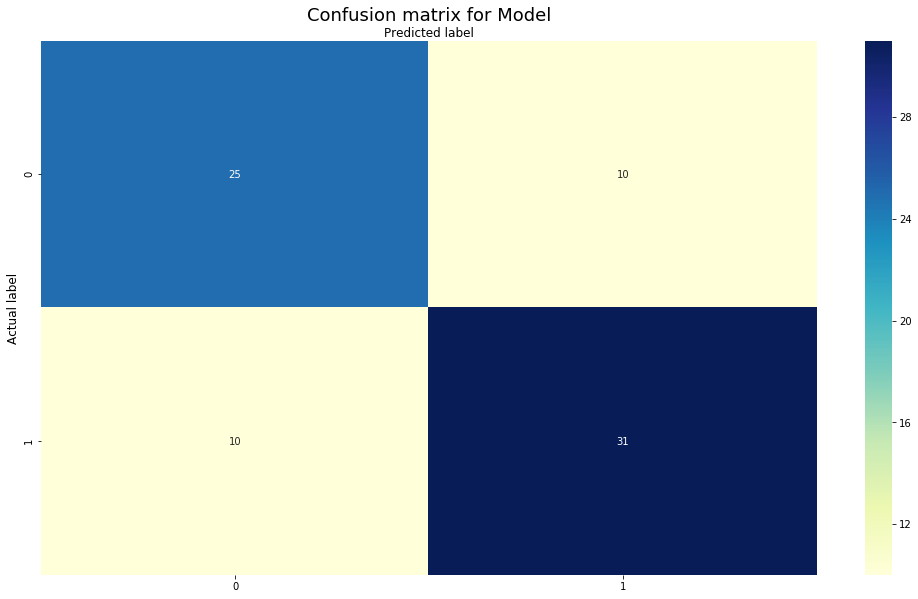

              precision    recall  f1-score   support

           0       0.71      0.71      0.71        35
           1       0.76      0.76      0.76        41

    accuracy                           0.74        76
   macro avg       0.74      0.74      0.74        76
weighted avg       0.74      0.74      0.74        76



In [48]:
confusionmatrix(pred)
classificationrep(pred)

### Plotting the accuracy (score) for different values of K for KNN classifier

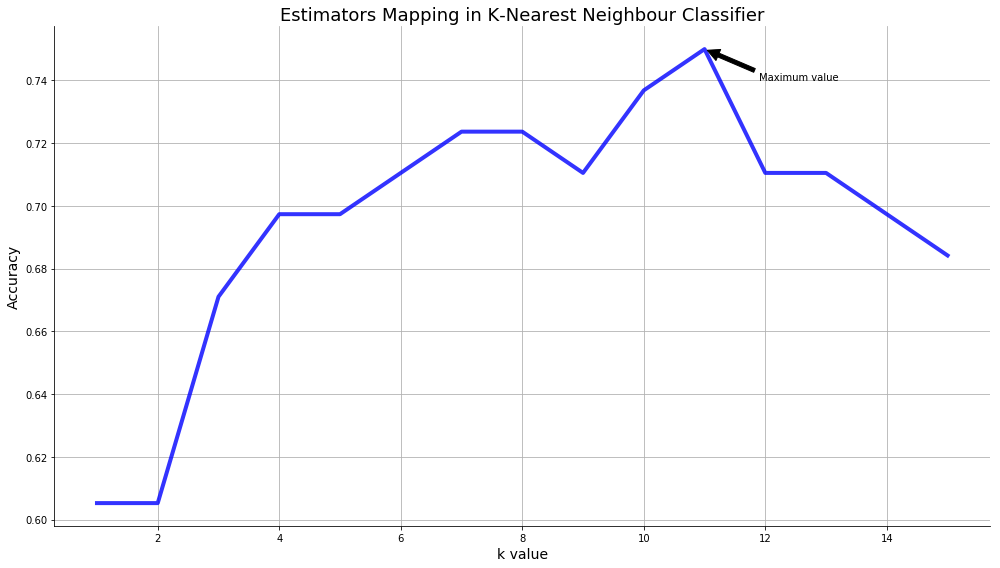

In [49]:
a = []
b = []
for i in range(1,16):
    clf = KNeighborsClassifier(n_neighbors=i)
    clf.fit(x_train,y_train)
    pred = clf.predict(x_test)
    c2 = clf.score(x_test, y_test)
    a.append(c2)
    b.append(i)

ymax = max(a)
plt.title("Estimators Mapping in K-Nearest Neighbour Classifier",fontsize=18)
plt.grid(True)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.plot(b,a,color="blue",alpha=0.8,linewidth=4)
plt.xlabel("k value",fontsize=14)
plt.ylabel("Accuracy",fontsize=14)

xpos = a.index(ymax)
xmax = b[xpos]

plt.annotate('Maximum value',xy=(xmax, ymax),arrowprops=dict(facecolor='black', shrink=0.05),xytext=(xmax+0.9, ymax-0.01))

plt.tight_layout()
plt.show()

We see that by increasing value of K, accuracy increases and reach at Maximum for k = 11.

Then as the value of K increases, accuracy decreases due to overfitting.

### Bayes theorem
It works on conditional probability. Conditional probability is the probability that something will happen, given that something else has already occurred. Using the conditional probability, we can calculate the probability of an event using its prior knowledge.

Naive Bayes classifier assumes that all the features are unrelated to each other and calculates using Bayes theorem.

We are using Naive Bayes classifier because distribution of attributes is following Normal Distribution and attributes are very less correlated to each other.

In [50]:
clf = GaussianNB()
clf.fit(x_train,y_train)
pred = clf.predict(x_test)
c3 = clf.score(x_test, y_test)
print(c3)

0.881578947368421


### Confusion matrix for above classifier

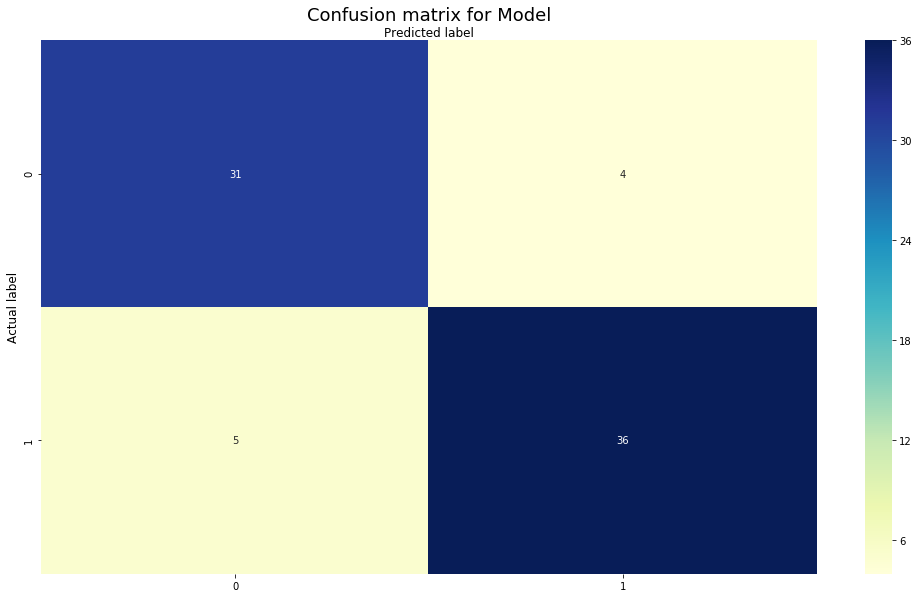

              precision    recall  f1-score   support

           0       0.86      0.89      0.87        35
           1       0.90      0.88      0.89        41

    accuracy                           0.88        76
   macro avg       0.88      0.88      0.88        76
weighted avg       0.88      0.88      0.88        76



In [51]:
confusionmatrix(pred)
classificationrep(pred)

### Logistic Regression

To predict which class a data belongs, a threshold can be set. Based upon this threshold, the obtained estimated probability is classified into classes.

We try to fit in a sigmoid curve for a data.

This is applicable usually for 2 classes which are linearly seperable, based on the probablity of data point.

If probablity is > 50%, we choose one class else another

In [52]:
clf = LogisticRegression(solver='newton-cg')
clf.fit(x_train,y_train)
pred = clf.predict(x_test)
c4 = clf.score(x_test, y_test)
print(c4)

0.8947368421052632


From above classifier, we see very high accuracy because the data provided is Linearly Seperable

### Confusion matrix for above classifier

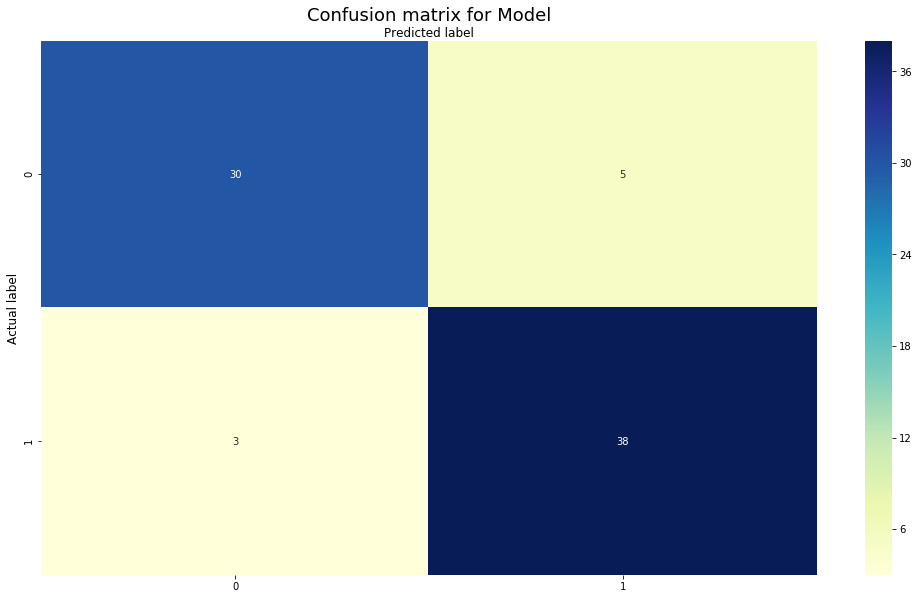

              precision    recall  f1-score   support

           0       0.91      0.86      0.88        35
           1       0.88      0.93      0.90        41

    accuracy                           0.89        76
   macro avg       0.90      0.89      0.89        76
weighted avg       0.90      0.89      0.89        76



In [53]:
confusionmatrix(pred)
classificationrep(pred)

### Comparing accuracy of Classification Algorithms used :-

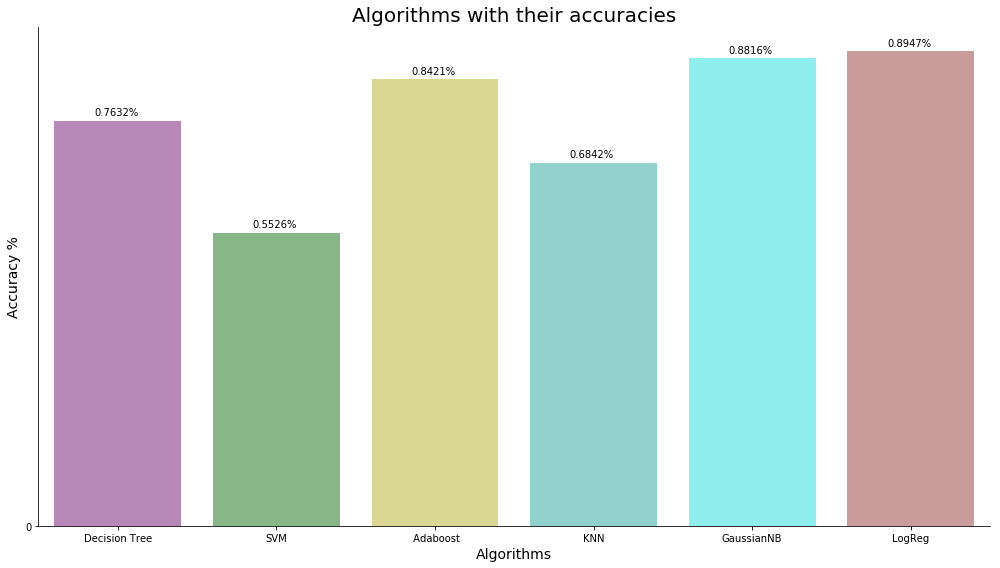

In [54]:
colors = ["purple", "green","#CFC60E","#0FBBAE","cyan","brown"]
models = ["Decision Tree", "SVM"," Adaboost","KNN","GaussianNB","LogReg"]
accuracies = [d1,s1,c1,c2,c3,c4]

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.title("Algorithms with their accuracies",fontsize=20)
plt.yticks(np.arange(0,100,10))
plt.ylabel("Accuracy %",fontsize=14)
plt.xlabel("Algorithms",fontsize=14)
ax = sns.barplot(x=models, y=accuracies, palette=colors,alpha=0.5)

for p in ax.patches:
        percentage = '{:.4f}%'.format(100 * p.get_height()/100)
        x = p.get_x() + p.get_width()/2 - 0.15
        y = p.get_y() + p.get_height() + 0.01
        ax.annotate(percentage, (x, y))

plt.tight_layout()
plt.show()

From above results, we can say that :

* Logistic Regression is best classifier on this dataset amongst all other classifiers used
* Linearly seperable task can easily be done by Linear Classifiers and there is no need to use advance classifiers for such small data as they would lead to Over-fitting which was seen here